# Predicting Batted Ball Outcomes Using Statcast's New Swing Data

## Maxwell Resnick's Submission to Nick Wan's Kaggle Competition

In this notebook, we will predict batted ball outcomes using Statcast's new swing data, along with pitch metrics and situational data. We will build three multiclassification model types and run their predictions through an optimization method to obtain a weighted average of the predictions. We will also explore feature engineering and utilize less complex linear and additive models for feature engineering purposes.

### Import Packages and Data

In [95]:
#import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from catboost import CatBoostClassifier
from pygam import GAM, s, te, l
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings('ignore')

In [4]:
#import data
train_df = pd.read_csv('/Users/maxwellresnick/baseball-and-stuff/baseball/wan-competition/nwds-batted-balls/train.csv')
test_df = pd.read_csv('/Users/maxwellresnick/baseball-and-stuff/baseball/wan-competition/nwds-batted-balls/test.csv')

### Exploratory Data Analysis

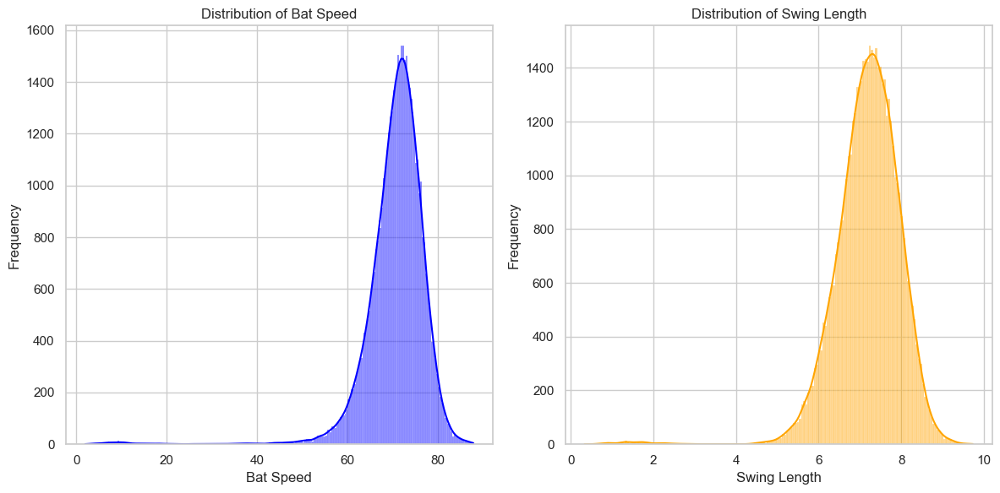

In [5]:
#plot histograms for bat speed and swing length
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(train_df['bat_speed'], ax=axes[0], kde=True, color='blue')
axes[0].set_title('Distribution of Bat Speed')
axes[0].set_xlabel('Bat Speed')
axes[0].set_ylabel('Frequency')

sns.histplot(train_df['swing_length'], ax=axes[1], kde=True, color='orange')
axes[1].set_title('Distribution of Swing Length')
axes[1].set_xlabel('Swing Length')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


When given a dataset, I find that visualizing histograms of potentially significant variables is a great way to start. The importance of this is shown above, as we can see that both distributions for bat speed and swing length are *technically* bimodal, as they contain a tiny hump in the low bat speed and low swing length regions. This is because of bunts, and we need to treat bunts differently than normal batted ball events. 

In [6]:
#criteria for bunts: swing length <= 4ft & bat speed <= 40mph
train_df['is_bunt'] = np.where(((train_df['swing_length'] <= 4) & (train_df['bat_speed'] <= 40)), 1, 0)
test_df['is_bunt'] = np.where(((test_df['swing_length'] <= 4) & (test_df['bat_speed'] <= 40)), 1, 0)

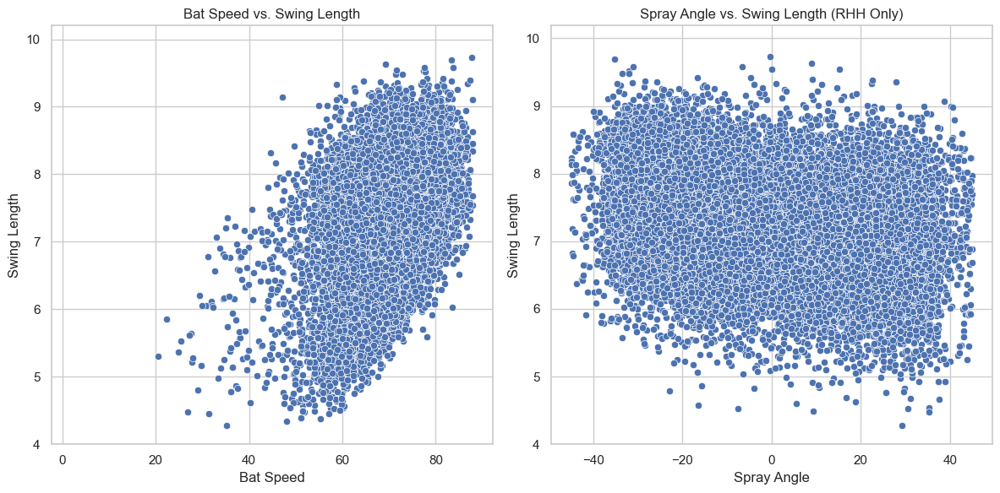

In [94]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.scatterplot(data=train_df, x='bat_speed', y='swing_length', ax=axes[0])
axes[0].set_title('Bat Speed vs. Swing Length')
axes[0].set_xlabel('Bat Speed')
axes[0].set_ylabel('Swing Length')
#exclude bunts
axes[0].set_ylim(4, None)

sns.scatterplot(data=train_df[train_df['is_lhb'] == 0], x='spray_angle', y='swing_length', ax=axes[1])
axes[1].set_title('Spray Angle vs. Swing Length (RHH Only)')
axes[1].set_xlabel('Spray Angle')
axes[1].set_ylabel('Swing Length')
#exclude bunts
axes[1].set_ylim(4, None)

plt.tight_layout()
plt.show()

We can see that swing length is fairly correlate with both bat speed and spray angle, which makes sense. The more pulled a ball is, the more a swing needs to travel to catch it out in front. Also, the longer the swing, the more time it has to accelerate to a high bat speed. There is also likely some player archetype bias here. Players with high bat speed likely have longer swings, and players with low bat speed likely need shorter swings to survive in the majors.

### Feature Engineering

To begin the feature engineering process, I had the idea to apply Max Bay's work on deriving spin componenets from Statcast data to this task. Essentially, Bay created a series of functions that convert Statcast metrics into `spin_x`, `spin_y`, and `spin_z` values. His work can be found using the link below.

https://github.com/maxbay/public_baseball/blob/main/notebooks/infer_spin_vector.ipynb

However, I decided that it would be more valuable for this particular task to calculate spin components of the ball at the plate instead of out of hand. These likely won't be *too* different, but due to seam-shifted wake they won't be the same. To do this, I replaced initial velocity values in each plane with final velocity values.

In [7]:
#the functions below were created by Max Bay and slightly modified by me
def calculate_air_density(altitude):
    #since we don't know the ballpark that a pitch was thrown in, we will (falsely) assume all stadiums are at sea level
    sea_level_temp = 288.15
    sea_level_pressure = 101325
    lapse_rate = 0.0065
    gas_constant = 287.05

    temperature = sea_level_temp - lapse_rate * altitude
    pressure = sea_level_pressure * (1 - (lapse_rate * altitude / sea_level_temp)) ** (9.80665 / (gas_constant * lapse_rate))
    air_density = pressure / (gas_constant * temperature)

    return air_density

def estimate_k(altitude=None):
    sea_level_density = 1.225
    k0 = 5.383E-03
    air_density = calculate_air_density(altitude)
    k = k0 * (sea_level_density / air_density)
    return k

def add_release_metrics(df):
    z_constant = 32.174

    df = (
        df
        .assign(
            yR=lambda df: 60.5 - df['release_extension'],
            tR=lambda df: (-df['vy0'] - np.sqrt(df['vy0']**2 - 2 * df['ay'] * (50 - df['yR']))) / df['ay'],
            vxR=lambda df: df['vx0'] + df['ax'] * df['tR'],
            vyR=lambda df: df['vy0'] + df['ay'] * df['tR'],
            vzR=lambda df: df['vz0'] + df['az'] * df['tR'],
            tf=lambda df: (-df['vyR'] - np.sqrt(df['vyR']**2 - 2 * df['ay'] * (df['yR'] - 17/12))) / df['ay'],
            vxbar=lambda df: (2 * df['vxR'] + df['ax'] * df['tf']) / 2,
            vybar=lambda df: (2 * df['vyR'] + df['ay'] * df['tf']) / 2,
            vzbar=lambda df: (2 * df['vzR'] + df['az'] * df['tf']) / 2,
            vbar=lambda df: np.sqrt(df['vxbar']**2 + df['vybar']**2 + df['vzbar']**2),
            adrag=lambda df: -(df['ax'] * df['vxbar'] + df['ay'] * df['vybar'] + (df['az'] + z_constant) * df['vzbar']) / df['vbar'],
            amagx=lambda df: df['ax'] + df['adrag'] * df['vxbar'] / df['vbar'],
            amagy=lambda df: df['ay'] + df['adrag'] * df['vybar'] / df['vbar'],
            amagz=lambda df: df['az'] + df['adrag'] * df['vzbar'] / df['vbar'] + z_constant,
            amag=lambda df: np.sqrt(df['amagx']**2 + df['amagy']**2 + df['amagz']**2),
            K=lambda df: estimate_k(df['altitude']),
            Cl=lambda df: df['amag'] / (df['K'] * df['vbar']**2),
            s=lambda df: 0.166 * np.log(0.336 / (0.336 - df['Cl'])),
            spinT=lambda df: 78.92 * df['s'] * df['vbar'],
            spin_efficiency=lambda df: np.minimum(df['spinT'] / df['release_spin_rate'], 1)
        )
        .dropna(subset=['vx0','vy0','vz0','ax','ay','az','release_extension','release_spin_rate','spin_axis'])
        .reset_index(drop=True)
    )

    return df

def solve_spin_components_method_1(total_spin, phi, mean_cos_theta_s, vx, vy, vz):
    phi = np.radians((phi + 90) % 360)
    
    v = np.sqrt(vx**2 + vy**2 + vz**2)
    v_hat_x = vx / v
    v_hat_y = vy / v
    v_hat_z = vz / v
    
    A = v_hat_x * np.cos(phi) + v_hat_z * np.sin(phi)
    B = v_hat_y
    C = mean_cos_theta_s
    
    R = np.sqrt(A**2 + B**2)
    X = np.arctan2(B, A)
    
    Theta = np.arcsin(C / R) - X
    
    omega_x = total_spin * np.sin(Theta) * np.cos(phi)
    omega_y = total_spin * np.cos(Theta)
    omega_z = total_spin * np.sin(Theta) * np.sin(phi)
    
    return omega_x, omega_y, omega_z

def add_spin_components(df, method=1):
    if method == 1:
        fun = solve_spin_components_method_1
    else:
        raise ValueError('Method must be 1 to use solve_spin_components_method_1')

    #use final velocities instead of initial velocities
    df['spin_x'], df['spin_y'], df['spin_z'] = zip(*df.apply(
        lambda row: fun(
            row['release_spin_rate'], 
            row['spin_axis'], 
            row['spin_efficiency'], 
            row['vx_f'], 
            row['vy_f'], 
            row['vz_f']), axis=1))

    return df

/var/folders/l7/wzwhjfv129l1wmlklwpt_j_r0000gn/T/ipykernel_57121/2216904508.py:68: RuntimeWarning: invalid value encountered in arcsin
  Theta = np.arcsin(C / R) - X
/var/folders/l7/wzwhjfv129l1wmlklwpt_j_r0000gn/T/ipykernel_57121/2216904508.py:68: RuntimeWarning: invalid value encountered in arcsin
  Theta = np.arcsin(C / R) - X


Along with these spin components, I also wanted to calculate the pitch's vertical and horizontal approach angles. My sources for how to do that can be found here:

- https://blogs.fangraphs.com/a-visualized-primer-on-vertical-approach-angle-vaa/
- https://blogs.fangraphs.com/a-visual-primer-on-horizontal-approach-angle-haa/


In [ ]:
#add approach angles along with spin components
def add_physics_vars(df):
    df['vy_f'] = -np.sqrt(df['vy0']**2 - (2 * df['ay'] * (50 - (17/2))))
    df['t'] = (df['vy_f'] - df['vy0']) / df['ay']
    df['vz_f'] = df['vz0'] + (df['az'] * df['t'])
    df['VAA'] = -np.arctan(df['vz_f'] / df['vy_f']) * (180 / np.pi)
    df['vx_f'] = df['vx0'] + (df['ax'] * df['t'])
    df['HAA'] = -np.arctan(df['vx_f'] / df['vy_f']) * (180 / np.pi)

    #assume altitude is sea level for all pitches
    df['altitude'] = 0

    df = add_release_metrics(df)
    df = add_spin_components(df, method=1)

    return df

train_df = add_physics_vars(train_df)
test_df = add_physics_vars(test_df)

In this feature engineering section, I chose to build a few simple models that allow us to calculate "above expected" variables. To do so, we need to mirror plate location and spray angle for left-handed hitters. It is also worthwhile to adjust pitch location height based on the strike zone's coordinates. 

In [8]:
def standardize_vars(df):
    #standardize plate x and spray angle to mirror lefty hitter values
    df['standardized_plate_x'] = df['plate_x']
    df.loc[df['is_lhb'] == 1, 'standardized_plate_x'] *= -1
    df['standardized_spray_angle'] = df['spray_angle']
    df.loc[df['is_lhb'] == 1, 'standardized_spray_angle'] *= -1

    #create a variable middleness_vert that shows how much above the middle-height of the strike zone a pitch is
    df['sz_mid'] = (df['sz_top'] + df['sz_bot']) / 2
    df['middleness_vert'] = df['plate_z'] - df['sz_mid']
    
    return df    

train_df = standardize_vars(train_df)
test_df = standardize_vars(test_df)

The first model we will build for feature engineering purposes is a GAM that estimates expected swing length, which allows us to calculate swing length above expected. I theorize when the swing length is close to expectation, there is reason to believe that the hitter's timing was better. When swing length is highly different from expectation, the hitter likely did not time the pitch well. 

For this model, we will define expectation as based on pitch location, pitch speed, bat speed, spray angle, and count. In the GAM, we will use tensor product terms for count and pitch location, and linear terms for pitch speed, bat speed, and mirrored spray angle.

In [9]:
#create a GAM to calculate swing length above expected
X = train_df[train_df['is_bunt'] == 0][['middleness_vert', 'standardized_plate_x', 'bat_speed', 'standardized_spray_angle', 
                                        'effective_speed', 'balls', 'strikes']]
y = train_df[train_df['is_bunt'] == 0]['swing_length']

swing_length_gam = GAM(te(0, 1) +
                        l(2) +
                        l(3) +
                        l(4) +
                        te(5, 6)).fit(X, y)

train_df['standardized_swing_length'] = swing_length_gam.predict(train_df[['middleness_vert', 'standardized_plate_x', 'bat_speed', 'standardized_spray_angle', 
                                                                            'effective_speed', 'balls', 'strikes']])

train_df['swing_length_oe'] = train_df['swing_length'] - train_df['standardized_swing_length']

The next GAM we will build is slightly more complex. The model structure itself is quite simple, but how we derive insights from it is not necessarily the most intuitive. The theory behind this model is to use spray angle to shed light on how squared up the ball is. I believe that we have sufficient reason to believe that batted ball characteristics are not constant across all spray angles. For instance, we know that for most swings, attack angle increases as the bat moves through the zone. For most swings, bat speed also increases as it moves through the zone (before deceleration). 

To prove this theory, we can look at home run probabiliy as a function of spray angle. We know that MLB outfield dimensions are not constant across all fields. The fences are shallower in the corners and deepest in center field. Therefore, if exit velocity, launch angle, and batted ball spin are constant at all spray angles, we should see home run probability as a function of spray angle take the inverse shape of outfield fence dimensions. 

In the GAM, we will also control for plate location, pitch speed, and bat speed (in order to truly capture the impact of spray angle on "squared-up-ness"). We will visualize the results and use the model's results shortly.

In [18]:
from pygam import LogisticGAM, s, l, te

#create logistic GAM that predicts home run probability based on spray angle (control for other relevant factors)
train_df['is_hr'] = (train_df['outcome_code'] == 4).astype(int)

X = train_df[train_df['is_bunt'] == 0][['standardized_spray_angle', 'bat_speed', 'release_speed', 
              'middleness_vert', 'standardized_plate_x']]

y = train_df[train_df['is_bunt'] == 0]['is_hr']

spray_gam = LogisticGAM(s(0) + 
                  l(1) +
                  l(2) +
                  te(3, 4)
                  ).fit(X, y)

In the meantime, I decided to create one more simple model, that measures expected spray angle based on pitch location and speed. This can be done through linear regression, and it allows us to calculate spray angle over expected.

In [11]:
X = train_df[train_df['is_bunt'] == 0][['standardized_plate_x', 'effective_speed']]
y = train_df[train_df['is_bunt'] == 0]['standardized_spray_angle']

spray_oe_model = LinearRegression()
spray_oe_model.fit(X, y)

LinearRegression()

The function below brings these three feature engineering models into action. The linear expected spray angle model and the swing length GAM are simply used to calculate spray angle over expected and swing length over expected. However, the use of the HR probability GAM is different. As I said before, if batted ball characteristics were constant across all spray angles, the partial dependence of spray angle on HR probability would form a U-shape. Therefore, we can estimate what that U-shape curve would look like, and calculate area above or below the curve as how much of a "barrel boost" we can associate with that particular spray angle. The plots below will showcase this thought. 

/var/folders/l7/wzwhjfv129l1wmlklwpt_j_r0000gn/T/ipykernel_57121/4203647111.py:38: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_points, y_points, 4)
/var/folders/l7/wzwhjfv129l1wmlklwpt_j_r0000gn/T/ipykernel_57121/4203647111.py:38: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_points, y_points, 4)


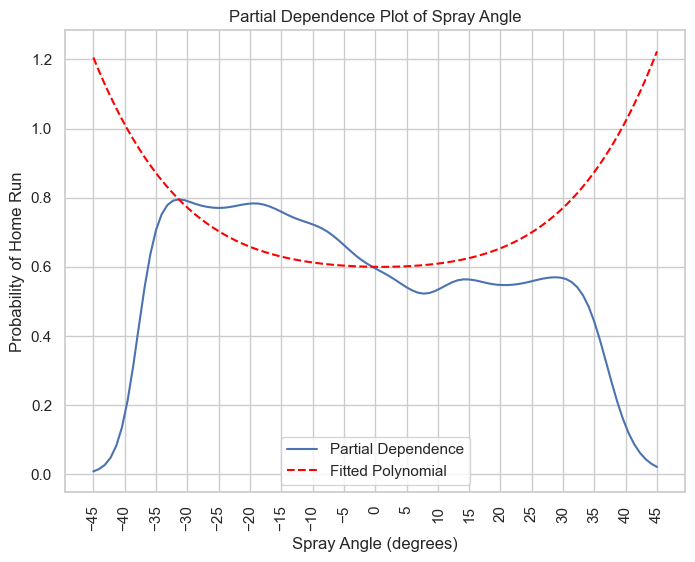

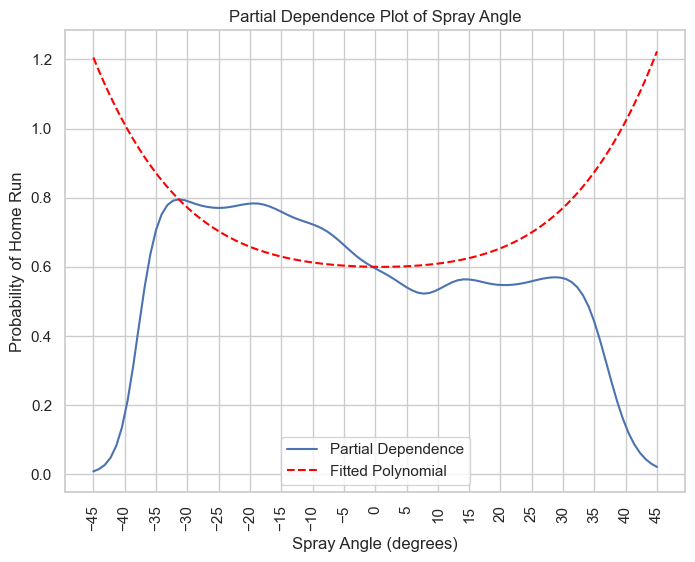

In [12]:
#apply the previous models
def add_model_vars(df):
    
    #calculate spray angle over expected
    df['spray_angle_oe'] = spray_oe_model.predict(df[['standardized_plate_x', 'effective_speed']]) - df['standardized_spray_angle']

    #calculate expected swing length
    df['standardized_swing_length'] = swing_length_gam.predict(df[['middleness_vert', 'standardized_plate_x', 'bat_speed', 
                                                                    'standardized_spray_angle', 'effective_speed', 'balls', 'strikes']])
    #calculate swing length over expected
    df['swing_length_oe'] = df['swing_length'] - df['standardized_swing_length']

    #calculate the HR probability solely based on spray angle    
    spray_hr_prob = spray_gam.partial_dependence(term=0, X=df[['standardized_spray_angle', 'bat_speed',  'release_speed', 
                                                                 'middleness_vert', 'standardized_plate_x']])
    
    #translate from log odds to probability
    df['spray_hr_prob'] = 1 / (1 + np.exp(-spray_hr_prob))

    plt.figure(figsize=(8, 6))
    plt.title("Partial Dependence Plot of Spray Angle")

    XX = spray_gam.generate_X_grid(term=0)

    log_odds = spray_gam.partial_dependence(term=0, X=XX)
    probabilities = 1 / (1 + np.exp(-log_odds))

    plt.plot(XX[:, 0], probabilities, label='Partial Dependence')

    #estimate the polynomial curve
    max_idx = np.argmax(probabilities)
    x1 = XX[max_idx, 0]
    y1 = probabilities[max_idx]

    zero_idx = np.argmin(np.abs(XX[:, 0] - 0))
    x2 = XX[zero_idx, 0]
    y2 = probabilities[zero_idx]

    x3 = abs(x1)
    y3 = y1

    x_points = np.array([x1, x2, x3])
    y_points = np.array([y1, y2, y3])
    coefficients = np.polyfit(x_points, y_points, 4)
    poly_curve = np.poly1d(coefficients)

    #calculate the curve value for each batted ball based on spray angle
    df['curve_value'] = poly_curve(df['standardized_spray_angle'])

    #calculate "barrel_boost" which measures the spray angle partial dependence over the curve
    df['barrel_boost'] = df['spray_hr_prob'] - df['curve_value']

    x_values = np.linspace(min(XX[:, 0]), max(XX[:, 0]), 100)
    y_values = poly_curve(x_values)

    plt.plot(x_values, y_values, linestyle='--', color='red', label='Fitted Polynomial')

    plt.xticks(np.arange(-45, 45 + 1, 5), rotation=90)

    plt.xlabel('Spray Angle (degrees)')
    plt.ylabel('Probability of Home Run')
    plt.grid(True)
    plt.legend()

    return df

train_df = add_model_vars(train_df)
test_df = add_model_vars(test_df)

Apologies for the double plot (I needed to call the function twice for training and testing data). As we can see, the partial dependence plot does not form a U-shape, as batted ball characteristics are not constant across all spray angles. We can see that the spray angles that get the highest barrel boost are the moderately pulled batted balls, which makes sense considering the attack angle is likely in a spot where batted balls can be elevated. What is particularly interesting is how rare it is for a ball to be barreled when the spray angles are extreme. Home run probability plummets when the spray angle is outside the -32.5 to 32.5 range. This is likely because elevated batted balls at these spray angles are likely heavily sliced or hooked, making them go foul. Therefore, the batted balls at these spray angles that stay fair are likely not elevated. This proves my theory that spray angle is way more powerful than some would realize, as it gives us insights on how likely a batted ball is to be barreled.

There are also more simplistic features worth creating that are displayed in the function below.

In [ ]:
def prepare_data(df):
    #same side if is_lhb and is_lhp are equal
    df['same_side'] = np.where(df['is_lhb'] == df['is_lhp'], 1, 0)

    #map pitch types to Boolean is_fb, is_bb, and is_os
    pitch_type_mapping = {
        'FF': 'FB', 'SI': 'FB', 'FA': 'FB',
        'SL': 'BB', 'FC': 'BB', 'ST': 'BB', 'CU': 'BB', 'FS': 'BB', 'KC': 'BB', 'SV': 'BB', 'CS': 'BB',
        'CH': 'OS', 'FS': 'OS', 'KN': 'OS', 'EP': 'OS', 'FO': 'OS', 'SC': 'OS'
    }

    df['pitch_type_grouping'] = df['pitch_type'].map(pitch_type_mapping)

    df['is_fb'] = (df['pitch_type_grouping'] == 'FB').astype(int)
    df['is_bb'] = (df['pitch_type_grouping'] == 'BB').astype(int)
    df['is_os'] = (df['pitch_type_grouping'] == 'OS').astype(int)

    #impute mean spin components based on handedness and pitch type grouping to fill NA
    df['spin_x'] = df.groupby(['is_lhp', 'pitch_type_grouping'])['spin_x'].transform(lambda x: x.fillna(x.mean()))
    df['spin_y'] = df.groupby(['is_lhp', 'pitch_type_grouping'])['spin_y'].transform(lambda x: x.fillna(x.mean()))
    df['spin_z'] = df.groupby(['is_lhp', 'pitch_type_grouping'])['spin_z'].transform(lambda x: x.fillna(x.mean()))


    #calculate final velocity in MPH
    df['final_velocity_mph'] = df['vy_f'] * -0.6818026863

    #calculate maximum possible exit velocity with a collision efficiency of 0.23 
    #http://tangotiger.com/index.php/site/article/statcast-lab-collisions-and-the-perfect-swing
    df['max_exit_velo_possible'] = 0.23 * (df['final_velocity_mph']) + (1 + 0.23) * (df['bat_speed'])

    #calculate middleness of pitch height based on strike zone coordinates
    df['sz_mid'] = (df['sz_top'] + df['sz_bot']) / 2
    df['middleness_vert'] = df['plate_z'] - df['sz_mid']

    #calculate acceleration of swing (falsely) assuming constant acceleration
    df['bat_speed_fps'] = df['bat_speed'] * 1.4667
    df['tangential_acceleration'] = df['bat_speed_fps']**2 / (2 * df['swing_length'])

    #calculate the time in between swing start and contact
    df['time_to_contact'] = df['bat_speed_fps'] / df['tangential_acceleration']

    #calculate time in between pitch release and swing start
    df['swing_decision_time'] = df['t'] - df['time_to_contact']

    #calculate Booleans for sac 3B annd sac 2B situations
    df['sac_3b_situation'] = np.where((df['on_3b'] != -1) & (df['outs_when_up'] < 2), 1, 0)
    df['sac_2b_situation'] = np.where((df['on_2b'] != -1) & (df['outs_when_up'] == 0), 1, 0)

    #Boolean for whether there's a runner in scoring position
    df['is_risp'] = np.where((df['on_3b'] != -1) | (df['on_2b'] != -1), 1, 0)

    #Boolean for if the hitter is home or away
    df['hitter_home'] = (df['is_top'] == 0).astype(int)

    #Boolean for whether it is a bunt situation (will be used in bunt model)
    df['bunt_situation'] = (
        ((df['on_1b'] != -1) & (df['outs_when_up'] == 0)) |
        ((df['on_2b'] != -1) & (df['outs_when_up'] == 0)) |
        ((df['on_3b'] != -1) & (df['outs_when_up'] <= 1)) |
        ((df['on_1b'] != -1) & (df['on_2b'] != -1) & (df['outs_when_up'] <= 1))
    ).astype(int)

    return df

training_set = prepare_data(train_df)
testing_set = prepare_data(test_df)

bunt_training_set = training_set[training_set['is_bunt'] == 1]
bunt_testing_set = testing_set[testing_set['is_bunt'] == 1]

dt = training_set[training_set['is_bunt'] == 0]
nt = testing_set[testing_set['is_bunt'] == 0]

In [ ]:
features = ['bat_speed', 'swing_length', 'spray_angle', 'swing_length_oe', 'spray_angle_oe', 'barrel_boost', 'max_exit_velo_possible',
            'tangential_acceleration', 'time_to_contact', 'swing_decision_time', 'release_speed', 'plate_x', 'middleness_vert',
            'pfx_x', 'pfx_z', 'release_pos_x', 'release_pos_y', 'release_pos_z', 'spin_x', 'spin_y', 'spin_z', 'VAA', 'HAA',
            'balls', 'strikes', 'is_lhb', 'same_side', 'is_fb', 'inning', 'outs_when_up', 'sac_2b_situation', 'sac_3b_situation', 
            'is_risp', 'hitter_home']

X = dt[features]
y = dt['outcome_code']

Feature Glossary:
- `bat_speed`: Velocity of the bat at the point of contact.
- `swing_length`: Length of the swing from swing start to contact.
- `spray_angle`: Horizontal direction of batted ball launch.
- `swing_length_oe`: Swing length over expected, with expectation based on pitch location, pitch speed, bat speed, spray angle, and count.
- `spray_angle_oe`: Spray angle over expected, with expectation based on pitch location and pitch speed.
- `barrel_boost`: Estimation of the impact spray angle has on the likelihood the ball was squared up.
- `max_exit_velo_possible`: Maximum possible exit velocity based on pitch final velocity and bat speed at contact.
- `tangential_acceleration`: The acceleration of the swing, (falsely) assuming constant acceleration.
- `time_to_contact`: The time in between swing start and contact.
- `swing_decision_time`: The time in between ball release and swing start.
- `release_speed`: Pitch velocity.
- `plate_x`: Horizontal plate location.
- `middleness_vert`: Vertical plate location, adjusting for strike zone coordinates.
- `pfx_x`: Horizontal break.
- `pfx_z`: Induced vertical break.
- `release_pos_x`: Horizontal release point.
- `release_pos_y`: The y-plane distance the ball needs to travel to reach home plate (60.5 - extension).
- `release_pos_z`: Vertical release point.
- `spin_x`: The pitch's x-component spin at home plate.
- `spin_y`: The pitch's y-component spin at home plate.
- `spin_z`: The pitch's z-component spin at home plate.
- `VAA`: Vertical approach angle of the pitch.
- `HAA`: Horizontal approach angle of the pitch.
- `balls`: Number of balls.
- `strikes`: Number of strikes.
- `is_lhb`: Boolean variable for whether the hitter is left-handed.
- `same_side`: Boolean variable for whether the hitter and pitcher are of the same handedness.
- `is_fb`: Boolean variable for whether the pitch is a fastball.
- `inning`: Inning number when the pitch occurred.
- `outs_when_up`: Number of outs when the pitch occurred.
- `sac_2b_situation`: Boolean variable for whether it is a sac situation with a runner on 2nd.
- `sac_3b_situation`: Boolean variable for whether it is a sac situation with a runner on 3rd.
- `is_risp`: Boolean variable for whether there is a runner in scoring position.
- `hitter_home`: Boolean variable for whether the hitter is playing at home.



# Modeling Procedure

For our modeling procedure, we will build three distinct model types: a gradient-boosted algorithm, a neural network, and a decision-tree-based model. We will then run the predictions of these three models through an optimizer to return the best final predictions for submission.

Since this competition is being graded on multiclassification one-vs-all AUC, we need to define a custom evaluation function.

In [15]:
#define evaluation function
def evaluate_auc(y_true, y_pred):
    return roc_auc_score(y_true, y_pred, multi_class='ovr', labels=range(5))

In [16]:
#define catboost objective
def catboost_objective(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
        'depth': trial.suggest_int('depth', 1, 10),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 1e-1, 10.0, log=True),
        'random_strength': trial.suggest_float('random_strength', 1e-3, 10.0, log=True),
    }
    
    #initialize CV procedure
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=13)
    cv_scores = []
    
    for train_idx, val_idx in cv.split(X, y):
        cat_X_train, cat_X_val = X.iloc[train_idx], X.iloc[val_idx]
        cat_y_train, cat_y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        model = CatBoostClassifier(**params, random_seed=13, verbose=0)
        model.fit(cat_X_train, cat_y_train, eval_set=(cat_X_val, cat_y_val), early_stopping_rounds=50, verbose=0)
        
        cat_y_pred = model.predict_proba(cat_X_val)
        cv_scores.append(evaluate_auc(cat_y_val, cat_y_pred))
    
    return np.mean(cv_scores)

#run Optuna study
catboost_study = optuna.create_study(direction='maximize')
catboost_study.optimize(catboost_objective, n_trials=100)
best_catboost_params = catboost_study.best_params
print("Best CatBoost Params:", best_catboost_params)

 0.21313764918051556, 'random_strength': 0.16154921540953365}. Best is trial 32 with value: 0.7513321842029963.
[I 2024-10-04 14:28:43,672] Trial 48 finished with value: 0.7435470646791259 and parameters: {'iterations': 886, 'learning_rate': 0.08936262392670695, 'depth': 2, 'min_data_in_leaf': 75, 'l2_leaf_reg': 0.31532458996479484, 'border_count': 224, 'bagging_temperature': 0.4040628061054323, 'random_strength': 0.3495146835629228}. Best is trial 32 with value: 0.7513321842029963.
[I 2024-10-04 14:29:29,666] Trial 49 finished with value: 0.7516187940042292 and parameters: {'iterations': 1089, 'learning_rate': 0.06447614590900683, 'depth': 4, 'min_data_in_leaf': 17, 'l2_leaf_reg': 1.3221394845677532, 'border_count': 243, 'bagging_temperature': 0.12183461202816268, 'random_strength': 0.017971909668272695}. Best is trial 49 with value: 0.7516187940042292.
[I 2024-10-04 14:30:19,686] Trial 50 finished with value: 0.7441590037727938 and parameters: {'iterations': 1089, 'learning_rate': 0.

In [31]:
#define neural network class
class Net(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, dropout_rate):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.fc3 = nn.Linear(hidden_size2, 5)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        return x

#biild PyTorch framework
def train_pytorch_model(nn_X_train, nn_y_train, nn_X_val, nn_y_val, learning_rate=0.001,
                        hidden_size1=64, hidden_size2=32, dropout_rate=0.2, weight_decay=1e-5):
    scaler = StandardScaler()
    nn_X_train_scaled = scaler.fit_transform(nn_X_train)
    nn_X_val_scaled = scaler.transform(nn_X_val)

    nn_X_train_tensor = torch.FloatTensor(nn_X_train_scaled)
    nn_y_train_tensor = torch.LongTensor(nn_y_train.values)
    nn_X_val_tensor = torch.FloatTensor(nn_X_val_scaled)
    nn_y_val_tensor = torch.LongTensor(nn_y_val.values)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = Net(nn_X_train.shape[1], hidden_size1, hidden_size2, dropout_rate).to(device)
    criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    num_epochs = 100
    batch_size = 64

    for epoch in range(num_epochs):
        model.train()
        for i in range(0, len(nn_X_train_tensor), batch_size):
            batch_X = nn_X_train_tensor[i:i+batch_size].to(device)
            batch_y = nn_y_train_tensor[i:i+batch_size].to(device)

            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()

    model.eval()
    with torch.no_grad():
        val_outputs = model(nn_X_val_tensor.to(device))
        nn_y_pred = nn.functional.softmax(val_outputs, dim=1).cpu().numpy()

    return model, scaler, nn_y_pred

#define PyTorch objective
def pytorch_objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    hidden_size1 = trial.suggest_int('hidden_size1', 32, 128)
    hidden_size2 = trial.suggest_int('hidden_size2', 16, 64)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5, log=True)
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-2, log=True)

    #initialize CV procedure
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=13)
    cv_scores = []

    for train_idx, val_idx in cv.split(X, y):
        nn_X_train, nn_X_val = X.iloc[train_idx], X.iloc[val_idx]
        nn_y_train, nn_y_val = y.iloc[train_idx], y.iloc[val_idx]

        model, _, nn_y_pred = train_pytorch_model(nn_X_train, nn_y_train, nn_X_val, nn_y_val, learning_rate,
                                               hidden_size1, hidden_size2, dropout_rate, weight_decay)

        auc = evaluate_auc(nn_y_val, nn_y_pred)
        cv_scores.append(auc)

    return np.mean(cv_scores)

#run Optuna study
pytorch_study = optuna.create_study(direction='maximize')
pytorch_study.optimize(pytorch_objective, n_trials=20)
best_pytorch_params = pytorch_study.best_params
print("Best PyTorch Params:", best_pytorch_params)

[I 2024-10-07 12:31:09,448] A new study created in memory with name: no-name-ebfbaf5d-e02b-4d5e-b45e-8c50e985c7ad
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[I 2024-10-07 12:39:40,006] Trial 0 finished with value: 0.7322796014130402 and parameters: {'learning_rate': 0.0002939010203854455, 'hidden_size1': 95, 'hidden_size2': 62, 'dropout_rate': 0.10747806056140674, 'weight_decay': 2.6828662529918787e-06}. Best is trial 0 with value: 0.7322796014130402.
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[I 2024-10-07 12:46:37,896] Trial 1 finished with value: 0.7339277717799755 and parameters: {'learning_rate': 0.003827915671403385, 'hidden_size1': 32, 'hidden_size2': 25, 'dropout_rate': 0.18766384216761936, 'weight_decay': 0.0001036030558201748}. Best is trial 1 with value: 0.7339277717799755.
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[I 2024-10-07 12:54:07,345] Trial 2 finished with value: 0.7200173470075668 and parameters: {'learning_rate': 

In [34]:
#define RF objective
def rf_objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 1000)
    max_depth = trial.suggest_int('max_depth', 5, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 32)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 32)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None]) 
    
    #initialize CV procedure
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=13)
    cv_scores = []

    for train_idx, val_idx in cv.split(X, y):
        rf_X_train, rf_X_val = X.iloc[train_idx], X.iloc[val_idx]
        rf_y_train, rf_y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        scaler = StandardScaler()
        rf_X_train = scaler.fit_transform(rf_X_train)
        rf_X_val = scaler.transform(rf_X_val)

        rf_model = RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=13
        )
        
        rf_model.fit(rf_X_train, rf_y_train)
        
        rf_y_pred = rf_model.predict_proba(rf_X_val)
        
        auc_scores = []
        for i in range(5):
            auc = roc_auc_score((rf_y_val == i).astype(int), rf_y_pred[:, i])
            auc_scores.append(auc)
        
        cv_scores.append(np.mean(auc_scores))

    return np.mean(cv_scores)

#run RF study
rf_study = optuna.create_study(direction='maximize')
rf_study.optimize(rf_objective, n_trials=20)
best_rf_params = rf_study.best_params
print("Best RandomForest Params:", best_rf_params)

[I 2024-10-08 05:05:53,322] A new study created in memory with name: no-name-16e47c97-ef8b-454f-9310-4f57c478a797
[I 2024-10-08 09:38:50,872] Trial 0 finished with value: 0.7310348141530142 and parameters: {'n_estimators': 278, 'max_depth': 16, 'min_samples_split': 6, 'min_samples_leaf': 27, 'max_features': None}. Best is trial 0 with value: 0.7310348141530142.
[I 2024-10-08 09:54:47,966] Trial 1 finished with value: 0.7291891164380786 and parameters: {'n_estimators': 463, 'max_depth': 11, 'min_samples_split': 13, 'min_samples_leaf': 25, 'max_features': None}. Best is trial 0 with value: 0.7310348141530142.
[I 2024-10-08 09:56:53,310] Trial 2 finished with value: 0.7242504889207116 and parameters: {'n_estimators': 346, 'max_depth': 15, 'min_samples_split': 30, 'min_samples_leaf': 27, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.7310348141530142.
[I 2024-10-08 10:45:11,014] Trial 3 finished with value: 0.7162393520845126 and parameters: {'n_estimators': 912, 'max_depth': 24, '

### Generate Ensembled Predictions

Now that we have built each of the three models, we need to use them to generate final predictions that we can submit. There are multiple ways to do this, such as averaging them, weighted-averaging them, or building a meta model that blends them in a way that the model best sees fit. Regardless of what method we choice, we need to generate out-of-sample predictions with our hypertuned models.

In [40]:
#initialize CV steup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=13)

#define out-of-sample arrays and testing set arrays
catboost_oof = np.zeros((len(dt), 5))
pytorch_oof = np.zeros((len(dt), 5))
rf_oof = np.zeros((len(dt), 5))
test_catboost = np.zeros((len(nt), 5))
test_pytorch = np.zeros((len(nt), 5))
test_rf = np.zeros((len(nt), 5))

for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):
    print(f"Training fold {fold+1}")
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    #build CatBoost model with best params
    catboost_model = CatBoostClassifier(**best_catboost_params, random_seed=13, verbose=0)
    catboost_model.fit(X_train, y_train, eval_set=(X_val, y_val), early_stopping_rounds=50, verbose=0)
    #use the model to predcit on out-of-sample data
    catboost_oof[val_idx] = catboost_model.predict_proba(X_val)
    #use the model to predict on test set
    test_catboost += catboost_model.predict_proba(nt[features]) / 5

    #build PyTorch model with best params
    pytorch_model, scaler, pytorch_pred = train_pytorch_model(
        X_train, y_train, X_val, y_val, 
        learning_rate=best_pytorch_params['learning_rate'], 
        hidden_size1=best_pytorch_params['hidden_size1'], 
        hidden_size2=best_pytorch_params['hidden_size2'], 
        dropout_rate=best_pytorch_params['dropout_rate']
    )
    #use the neural net to predict on out-of-sample data and testing set
    pytorch_oof[val_idx] = pytorch_pred
    n_scaled = scaler.transform(nt[features])
    n_tensor = torch.FloatTensor(n_scaled).to(pytorch_model.fc1.weight.device)
    with torch.no_grad():
        test_pytorch += nn.functional.softmax(pytorch_model(n_tensor), dim=1).cpu().numpy() / 5

    #build RF model with best params
    rf_model = RandomForestClassifier(**best_rf_params)
    rf_model.fit(X_train[features], y_train)
    #predict on out-of-sample data
    rf_oof[val_idx] = rf_model.predict_proba(X_val)
    #predict on testing set
    test_rf += rf_model.predict_proba(nt[features]) / 5

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


I originally went with the meta model approach, but found that I got better results by using an optimization function to create a weighted average of the predictions. So, we will run through every set of possible weights in increments of 0.01 to find the optimal weighted average.

In [44]:
#create evluation function
def evaluate_combination(catboost_weight, pytorch_weight, rf_weight):
    weighted_predictions = (catboost_weight * catboost_oof + 
                            pytorch_weight * pytorch_oof + 
                            rf_weight * rf_oof)
    auc = roc_auc_score(dt['outcome_code'], weighted_predictions, multi_class='ovr', labels=range(5))
    return auc

#test out every combination of weights moving in increments of 0.01
weight_combinations = []
step_size = 0.01
for catboost_weight in np.arange(0, 1.01, step_size):
    for pytorch_weight in np.arange(0, 1.01 - catboost_weight, step_size):
        rf_weight = 1 - catboost_weight - pytorch_weight
        if rf_weight >= 0:
            weight_combinations.append((catboost_weight, pytorch_weight, rf_weight))

best_auc = 0
best_weights = None

#find the one that returns the best multiclass ovr AUC
for weights in weight_combinations:
    auc = evaluate_combination(*weights)
    if auc > best_auc:
        best_auc = auc
        best_weights = weights

print(f"Best Weights: CatBoost: {best_weights[0]:.4f}, PyTorch: {best_weights[1]:.4f}, RF: {best_weights[2]:.4f}")
print(f"Best AUC: {best_auc:.4f}")


Best Weights: CatBoost: 0.6100, PyTorch: 0.3400, RF: 0.0500
Best AUC: 0.7561


Now we can generate final predictions on our test set!

In [47]:
#generate final predictions on the test set
test_set_predictions = (best_weights[0] * test_catboost + 
                     best_weights[1] * test_pytorch + 
                     best_weights[2] * test_rf)

### Bunt Modeling

We want to treat bunts differently, because we'd prefer to look at them as a binary classification problem, with single and out as the two possible outcomes. *Technically*, doubles are possible, but I feel confident that it would be best to pretend that possibility doesn't exist.

In [96]:
from pygam import LogisticGAM, s, l, te, f

bunt_training_set['is_single'] = (bunt_training_set['outcome_code'] == 1).astype(int)

#define bunt features
bunt_X = bunt_training_set[['spray_angle', 'bat_speed', 'swing_length_oe', 'is_lhb', 'bunt_situation', 'same_side', 'is_fb', 'middleness_vert', 'plate_x']]
bunt_y = bunt_training_set['is_single']

#set up bunt GAM
bunt_gam = LogisticGAM(
    s(0) +
    s(1) +
    s(2) +
    f(3) +
    f(4) +
    f(5) +
    f(6) +
    te(7, 8)
)

bunt_gam.fit(bunt_X, bunt_y)

#make predictions on testing set
predictions = bunt_gam.predict_proba(bunt_testing_set[['spray_angle', 'bat_speed', 'swing_length_oe', 'is_lhb', 'bunt_situation', 'same_side', 'is_fb', 'middleness_vert', 'plate_x']])

bunt_testing_set['out'] = 1 - predictions
bunt_testing_set['single'] = predictions

#set double, triple, and homer probability to 0
bunt_testing_set['double'] = 0
bunt_testing_set['triple'] = 0
bunt_testing_set['home_run'] = 0

In [97]:
#calculate AUC
bunt_y_pred_proba = bunt_gam.predict_proba(bunt_X)

auc = roc_auc_score(bunt_y, bunt_y_pred_proba)
print(f"AUC: {auc}")

AUC: 0.8735535197685632


Just to ensure that our bunt model makes sense, we can plot the partial dependence of spray angle on single probability. Unsurprisingly, bunts down the third base line have the highest probabilities of turning into singles, and bunts right back to the pitcher have the lowest.

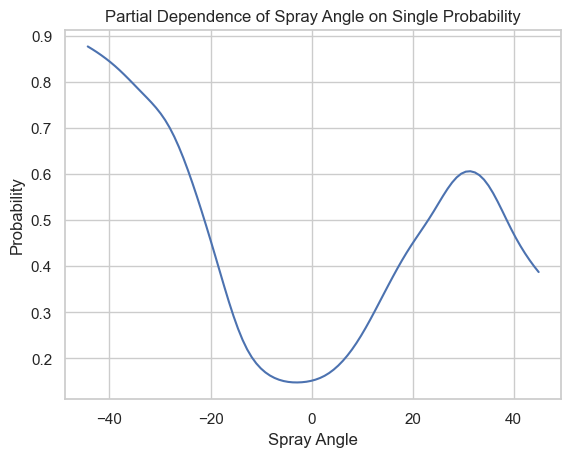

In [98]:
#plot partial dependence of spray angle
XX = bunt_gam.generate_X_grid(term=0)
partial_dep = bunt_gam.partial_dependence(term=0, X=XX)

partial_dep_prob = 1 / (1 + np.exp(-partial_dep))

plt.plot(XX[:, 0], partial_dep_prob)
plt.xlabel('Spray Angle')
plt.ylabel('Probability')
plt.title('Partial Dependence of Spray Angle on Single Probability')
plt.show()

In [90]:
#turn preds into a dataframe
test_predictions_df = pd.DataFrame(test_set_predictions, columns=['out', 'single', 'double', 'triple', 'home_run'])

nt = nt.reset_index(drop=True)

#append preds to testing set
test_predictions_df = pd.concat([nt, test_predictions_df], axis=1)

#combine testing set with bunt testing set
full_predictions_df = pd.concat([test_predictions_df, bunt_testing_set], axis=0)

#keep relevant columns and sort by uid
submission_df = full_predictions_df[['uid', 'single', 'double', 'triple', 'home_run']]
submission_df = submission_df.sort_values(by='uid', ascending=True)